In [ ]:
# import the necessary packages and define constants


import os
import cv2
import time
import shutil
import random
import pickle
import argparse
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt

from imutils import paths
from collections import defaultdict

from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import AveragePooling2D

from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.models import load_model
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split



ORIG_BASE_PATH = "dataset"
ORIG_IMAGES    = os.path.sep.join([ORIG_BASE_PATH, "images"])
ORIG_ANNOTS    = os.path.sep.join([ORIG_BASE_PATH, "annotations.csv"])

BASE_PATH      = "cropped_dataset"
POSITIVE_PATH  = os.path.sep.join([BASE_PATH, "vehicle"])
NEGATIVE_PATH  = os.path.sep.join([BASE_PATH, "no_vehicle"])

MODEL_PATH     = "vehicle_detector.h5"
ENCODER_PATH   = "label_encoder.pickle"

MIN_PROBA      = 0.95

MAX_PROPOSALS  = 2000
IOU_THRESHOLD  = 0.05
COUNT_OF_DETECT= 50
INPUT_DIMS     = (200, 200)

DATASET_IMAGE_SIZE    = (512,512)
MIN_DIM_TO_CONSIDER   = 50
NEGATIVE_SAMPLE_COUNT = 2

SAMPLES_TO_TRAIN = 8000
SAMPLES_TO_TEST  = 100
BATCH_SIZE     = 16
EPOCHS         = 5

In [ ]:
#to split the dataset in train and test


TRAIN_DATASET = "train_dataset"
TEST = "test"

TEST_DATASET = os.path.sep.join([TEST, "test_dataset"])
TEST_ANNOTS =  os.path.sep.join([TEST, "test_annotations.csv"])

if not os.path.exists(TEST):
    os.mkdir(TEST)
if not os.path.exists(TRAIN_DATASET):
    os.mkdir(TRAIN_DATASET)
if not os.path.exists(TEST_DATASET):
    os.mkdir(TEST_DATASET)
    
imagePaths = list(paths.list_images(ORIG_IMAGES))
annots  = pd.read_csv(ORIG_ANNOTS)

i=0
f = f'test/test_annotations.csv'
for x in annots.index:
    if i==0:
        annots.loc[[x]].to_csv(f, index=False)
        break

i=0
counter=1
for image in imagePaths:
    _filename = image.split('/')
    print("[INFO] processing image ...",counter)
    counter+=1
    if i%10:
        shutil.copy(image,os.path.join(TRAIN_DATASET,''))
    else:
        shutil.copy(image,os.path.join(TEST_DATASET,''))
        df = annots.loc[annots['filename'] == _filename[2]]
        for x in df.index:
            df.loc[[x]].to_csv(f, index=False,header=None, mode='a')
    i+=1

Streaming output truncated to the last 5000 lines.
[INFO] processing image ... 10002
[INFO] processing image ... 10003
[INFO] processing image ... 10004
[INFO] processing image ... 10005
[INFO] processing image ... 10006
[INFO] processing image ... 10007
[INFO] processing image ... 10008
[INFO] processing image ... 10009
[INFO] processing image ... 10010
[INFO] processing image ... 10011
[INFO] processing image ... 10012
[INFO] processing image ... 10013
[INFO] processing image ... 10014
[INFO] processing image ... 10015
[INFO] processing image ... 10016
[INFO] processing image ... 10017
[INFO] processing image ... 10018
[INFO] processing image ... 10019
[INFO] processing image ... 10020
[INFO] processing image ... 10021
[INFO] processing image ... 10022
[INFO] processing image ... 10023
[INFO] processing image ... 10024
[INFO] processing image ... 10025
[INFO] processing image ... 10026
[INFO] processing image ... 10027
[INFO] processing image ... 10028
[INFO] processing image ... 100

In [ ]:
#to build positive dataset

# if the output directory does not exist yet, create it
if not os.path.exists(POSITIVE_PATH):
    os.makedirs(POSITIVE_PATH)


# grab all image paths in the input images directory
imagePaths = list(paths.list_images(ORIG_IMAGES))

#read the csv and convert to dictionary
annotPath = ORIG_ANNOTS
annotsDf  = pd.read_csv(annotPath).values
annots    = defaultdict(list)

for i in range(annotsDf.shape[0]):
    fileName = annotsDf[i][0]
    annots[fileName].append(annotsDf[i][1:])

# initialize the total number of positive and negative images we have saved to disk so far
totalPositive = 0

# loop over the image paths
for (i, imagePath) in enumerate(imagePaths):

    # show a progress report
    print("[INFO] processing image {}/{}...".format(i + 1,len(imagePaths)))

    # extract the filename from the file path and use it to get its bounding boxes from the annotations file
    filename = imagePath.split(os.path.sep)[-1]

    w     = DATASET_IMAGE_SIZE[0]
    h     = DATASET_IMAGE_SIZE[1]
    image = cv2.imread(ORIG_IMAGES+'/'+filename)

    # loop over all boxes in the image
    for box in annots[filename]:
        
        if box[2]=="car" or box[2]=="truck":

            # extract the bounding box coordinates
            xMin = box[3]
            yMin = box[4]
            xMax = box[5]
            yMax = box[6]

            # truncate any bounding box coordinates that may fall outside the boundaries of the image
            xMin = max(0, xMin)
            yMin = max(0, yMin)
            xMax = min(w, xMax)
            yMax = min(h, yMax)
            
            if xMax-xMin>=MIN_DIM_TO_CONSIDER and yMax-yMin>=MIN_DIM_TO_CONSIDER:

                roi = image[yMin:yMax, xMin:xMax]
                roi = cv2.resize(roi,INPUT_DIMS,interpolation=cv2.INTER_CUBIC)
                cv2.imwrite(POSITIVE_PATH+'/'+str(totalPositive)+'.jpg', roi)
                totalPositive+=1

Streaming output truncated to the last 5000 lines.
[INFO] processing image 10002/15000...
[INFO] processing image 10003/15000...
[INFO] processing image 10004/15000...
[INFO] processing image 10005/15000...
[INFO] processing image 10006/15000...
[INFO] processing image 10007/15000...
[INFO] processing image 10008/15000...
[INFO] processing image 10009/15000...
[INFO] processing image 10010/15000...
[INFO] processing image 10011/15000...
[INFO] processing image 10012/15000...
[INFO] processing image 10013/15000...
[INFO] processing image 10014/15000...
[INFO] processing image 10015/15000...
[INFO] processing image 10016/15000...
[INFO] processing image 10017/15000...
[INFO] processing image 10018/15000...
[INFO] processing image 10019/15000...
[INFO] processing image 10020/15000...
[INFO] processing image 10021/15000...
[INFO] processing image 10022/15000...
[INFO] processing image 10023/15000...
[INFO] processing image 10024/15000...
[INFO] processing image 10025/15000...
[INFO] proces

In [ ]:
#to build negative dataset


# if the output directory does not exist yet, create it
if not os.path.exists(NEGATIVE_PATH):
    os.makedirs(NEGATIVE_PATH)


# grab all image paths in the input images directory
imagePaths = list(paths.list_images(ORIG_IMAGES))

# initialize the total number of negative images we have saved to disk so far
totalNegatives = 0

# loop over the image paths
for (i, imagePath) in enumerate(imagePaths):

    # show a progress report
    print("[INFO] processing image {}/{}...".format(i + 1,len(imagePaths)))

    # extract the filename from the file path and use it to get its bounding boxes from the annotations file
    filename = imagePath.split(os.path.sep)[-1]

    image = cv2.imread(ORIG_IMAGES+'/'+filename)

    for i in range(NEGATIVE_SAMPLE_COUNT):
        x = random.randint(0,DATASET_IMAGE_SIZE[0]-MIN_DIM_TO_CONSIDER*2)
        y = random.randint(0,DATASET_IMAGE_SIZE[1]-MIN_DIM_TO_CONSIDER*2)
        roi = image[y:y+MIN_DIM_TO_CONSIDER*2,x:x+MIN_DIM_TO_CONSIDER*2]
        roi = cv2.resize(roi,INPUT_DIMS,interpolation=cv2.INTER_CUBIC)
        cv2.imwrite(NEGATIVE_PATH+'/'+str(totalNegatives)+'.jpg', roi)
        totalNegatives+=1

Streaming output truncated to the last 5000 lines.
[INFO] processing image 10002/15000...
[INFO] processing image 10003/15000...
[INFO] processing image 10004/15000...
[INFO] processing image 10005/15000...
[INFO] processing image 10006/15000...
[INFO] processing image 10007/15000...
[INFO] processing image 10008/15000...
[INFO] processing image 10009/15000...
[INFO] processing image 10010/15000...
[INFO] processing image 10011/15000...
[INFO] processing image 10012/15000...
[INFO] processing image 10013/15000...
[INFO] processing image 10014/15000...
[INFO] processing image 10015/15000...
[INFO] processing image 10016/15000...
[INFO] processing image 10017/15000...
[INFO] processing image 10018/15000...
[INFO] processing image 10019/15000...
[INFO] processing image 10020/15000...
[INFO] processing image 10021/15000...
[INFO] processing image 10022/15000...
[INFO] processing image 10023/15000...
[INFO] processing image 10024/15000...
[INFO] processing image 10025/15000...
[INFO] proces

In [ ]:
#training the classifier on the dataset


# grab the list of images in our dataset directory, then initialize the list of data (i.e., images) and class labels
imagePaths = list(paths.list_images(BASE_PATH))
random.shuffle(imagePaths)


print('[INFO] Building Model....')

# load the MobileNetV2 network, ensuring the head FC layer sets are left off
baseModel = MobileNetV2(input_tensor=Input(shape=(INPUT_DIMS[0],INPUT_DIMS[1],3)),include_top=False,weights="imagenet")

# construct the head of the model that will be placed on top of the the base model
headModel = baseModel.output
headModel = AveragePooling2D(pool_size=(7, 7))(headModel)
headModel = Flatten(name="flatten")(headModel)
headModel = Dense(128, activation="relu")(headModel)
headModel = Dropout(0.5)(headModel)
headModel = Dense(2, activation="softmax")(headModel)

# place the head FC model on top of the base model (this will become the actual model we will train)
model = Model(inputs=baseModel.input, outputs=headModel)

# loop over all layers in the base model and freeze them so they will *not* be updated during the first training process
for layer in baseModel.layers:
    layer.trainable = False

# compile our model
print("[INFO] compiling model...")
opt = Adam(lr=0.0001)
model.compile(loss="binary_crossentropy", optimizer=opt,metrics=["accuracy"])
model.summary()


data = []
labels = []
print("[INFO] Loading ",SAMPLES_TO_TRAIN," Images ")
for imagePath in imagePaths[0:SAMPLES_TO_TRAIN]:

    # extract the class label from the filename
    label = imagePath.split(os.path.sep)[-2]

    # load the input image and preprocess it
    image = load_img(imagePath, target_size=INPUT_DIMS)
    image = img_to_array(image)
    image = preprocess_input(image)

    # update the data and labels lists, respectively
    data.append(image)
    labels.append(label)

# convert the data and labels to NumPy arrays
data = np.array(data, dtype="float32")
labels = np.array(labels)

# perform one-hot encoding on the labels
lb = LabelBinarizer()
labels = lb.fit_transform(labels)
labels = to_categorical(labels)

# partition the data into training and testing splits using 75% of the data for training and the remaining 25% for testing
(trainX, testX, trainY, testY) = train_test_split(data, labels,test_size=0.20, stratify=labels, random_state=42)

# train the head of the network
print("[INFO] training head...")
H = model.fit(trainX, trainY, batch_size=BATCH_SIZE,validation_data=(testX, testY),epochs=EPOCHS)

# make predictions on the testing set
print("[INFO] evaluating network...")
predIdxs = model.predict(testX, batch_size=BATCH_SIZE)

# for each image in the testing set we need to find the index of the label with corresponding largest predicted probability
predIdxs = np.argmax(predIdxs, axis=1)

# show a nicely formatted classification report
print(classification_report(testY.argmax(axis=1), predIdxs,target_names=lb.classes_))

# serialize the model to disk
print("[INFO] saving mask detector model...")
model.save(MODEL_PATH, save_format="h5")

# serialize the label encoder to disk
print("[INFO] saving label encoder...")
f = open(ENCODER_PATH, "wb")
f.write(pickle.dumps(lb))
f.close()
print("[INFO] Done ...")

[INFO] Building Model....
[INFO] compiling model...
Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 200, 200, 3) 0                                            
__________________________________________________________________________________________________
Conv1_pad (ZeroPadding2D)       (None, 201, 201, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 100, 100, 32) 864         Conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 100, 100, 32) 128         Conv1[0][0]                      
___________________________________

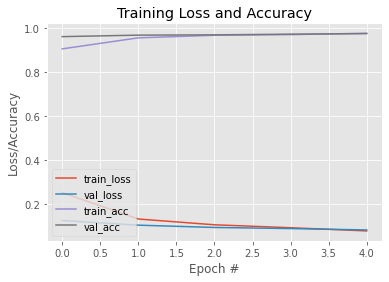

In [ ]:
#to plot the learning curve


N = EPOCHS
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, N), H.history["loss"], label="train_loss")
plt.plot(np.arange(0, N), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, N), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, N), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend(loc="lower left")
plt.savefig("plot")

In [ ]:
#defining the IoU function


def compute_iou(boxA, boxB):

    # epsilon to prevent division by zero error
    epsilon = 0.0001

    # determine the (x, y)-coordinates of the intersection rectangle
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])


    # compute the area of intersection rectangle
    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)


    # compute the area of both the prediction and ground-truth rectangles
    boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
    boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)


    # compute the intersection over union by taking the intersection area and dividing it by the sum of prediction + ground-truth areas - the intersection area
    div = float(boxAArea + boxBArea - interArea)
    iou = interArea / (div + epsilon)

    return iou

In [ ]:
#defining a function to check predicted box against ground truth boxes


def checkPred(predictedBox, gtBoxes):
    iou=0
    for gtBox in gtBoxes:
        if(gtBox[2]!='car' and gtBox[2]!='truck'):
            continue
        epsilon = 0.00000001
        gtBox=[int(gtBox[3]),int(gtBox[4]),int(gtBox[5]),int(gtBox[6])]
        xA = max(predictedBox[0], gtBox[0])
        yA = max(predictedBox[1], gtBox[1])
        xB = min(predictedBox[2], gtBox[2])
        yB = min(predictedBox[3], gtBox[3])

        interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
        predictedBoxArea = (predictedBox[2] - predictedBox[0] + 1)*(predictedBox[3] - predictedBox[1] + 1)
        gtBoxArea = (gtBox[2] - gtBox[0] + 1)*(gtBox[3] - gtBox[1] + 1)

        div = float(predictedBoxArea + gtBoxArea - interArea)
        iou = interArea/(div +epsilon)
        if iou>0.3:
            return 1
    return 0

In [ ]:
#defining a function to check ground truth box against predicted boxes


def checkGround(predictedBox, gtBoxes):
    iou=0
    for gtBox in gtBoxes:
        epsilon = 0.00000001
        xA = max(predictedBox[0], gtBox[0])
        yA = max(predictedBox[1], gtBox[1])
        xB = min(predictedBox[2], gtBox[2])
        yB = min(predictedBox[3], gtBox[3])

        interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
        predictedBoxArea = (predictedBox[2] - predictedBox[0] + 1)*(predictedBox[3] - predictedBox[1] + 1)
        gtBoxArea = (gtBox[2] - gtBox[0] + 1)*(gtBox[3] - gtBox[1] + 1)

        div = float(predictedBoxArea + gtBoxArea - interArea)
        iou = interArea/(div +epsilon)
        if iou>0.3:
            return 1
    return 0

[INFO] loading model, label binarizer and Annotations
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


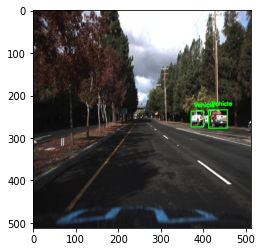

Time :  9  Secs
Predicted : 2
Correct   : 2
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


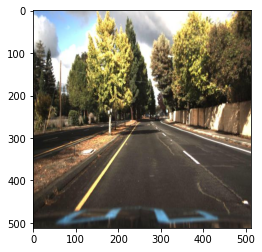

Time :  8  Secs
Predicted : 0
Correct   : 0
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


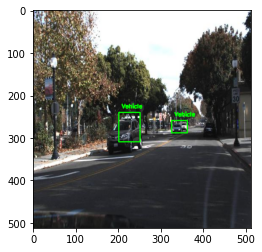

Time :  9  Secs
Predicted : 2
Correct   : 2
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


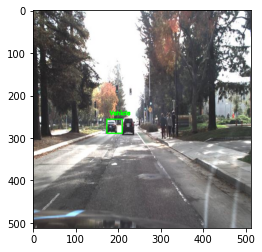

Time :  9  Secs
Predicted : 1
Correct   : 1
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


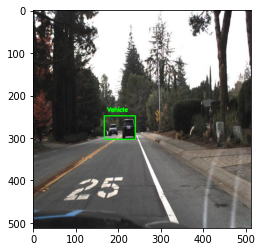

Time :  8  Secs
Predicted : 1
Correct   : 1
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


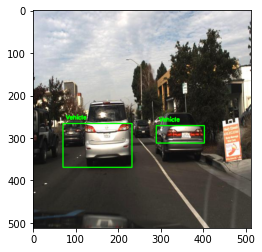

Time :  9  Secs
Predicted : 2
Correct   : 1
Missed    : 4
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


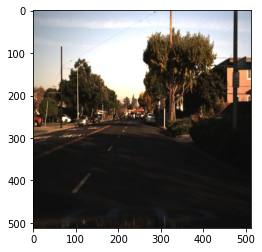

Time :  9  Secs
Predicted : 0
Correct   : 0
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


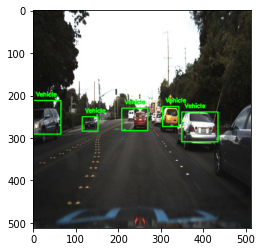

Time :  8  Secs
Predicted : 5
Correct   : 5
Missed    : 1
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


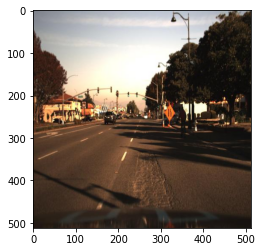

Time :  9  Secs
Predicted : 0
Correct   : 0
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


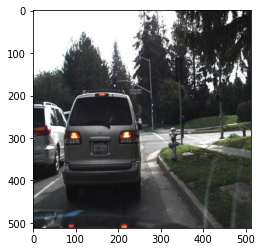

Time :  9  Secs
Predicted : 0
Correct   : 0
Missed    : 2
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


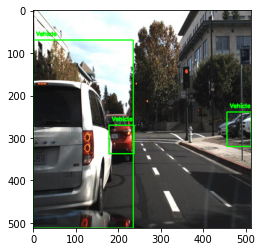

Time :  9  Secs
Predicted : 3
Correct   : 3
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


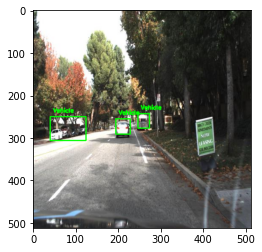

Time :  9  Secs
Predicted : 3
Correct   : 2
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


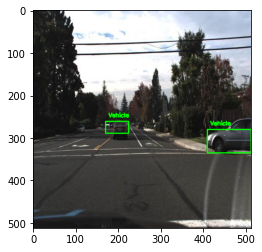

Time :  8  Secs
Predicted : 2
Correct   : 2
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


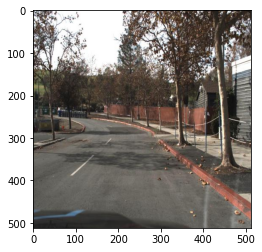

Time :  9  Secs
Predicted : 0
Correct   : 0
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


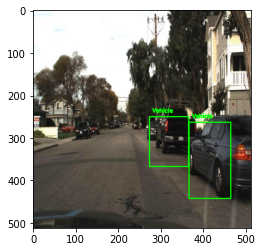

Time :  9  Secs
Predicted : 2
Correct   : 2
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


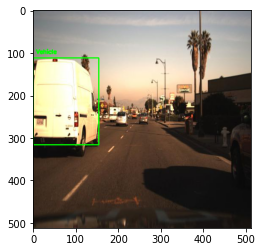

Time :  8  Secs
Predicted : 1
Correct   : 1
Missed    : 1
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


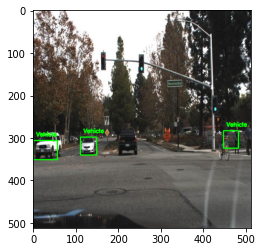

Time :  9  Secs
Predicted : 3
Correct   : 2
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


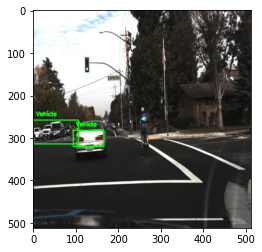

Time :  9  Secs
Predicted : 2
Correct   : 1
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


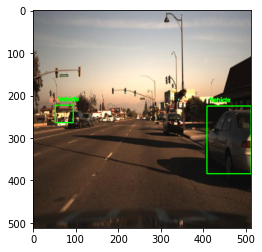

Time :  8  Secs
Predicted : 2
Correct   : 1
Missed    : 2
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


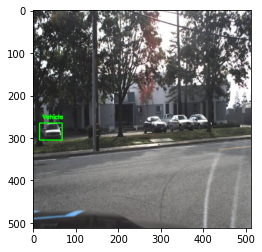

Time :  9  Secs
Predicted : 1
Correct   : 1
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


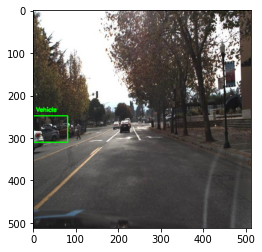

Time :  9  Secs
Predicted : 1
Correct   : 1
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


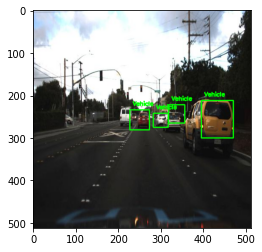

Time :  9  Secs
Predicted : 4
Correct   : 3
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


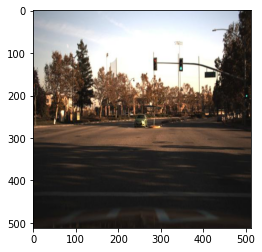

Time :  9  Secs
Predicted : 0
Correct   : 0
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


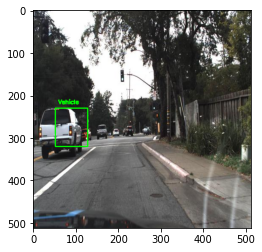

Time :  9  Secs
Predicted : 1
Correct   : 1
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (1747, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


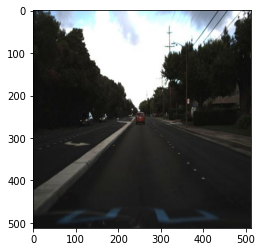

Time :  7  Secs
Predicted : 0
Correct   : 0
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


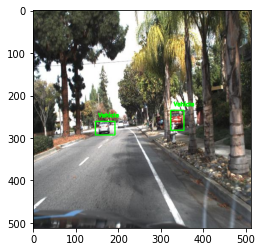

Time :  9  Secs
Predicted : 2
Correct   : 2
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


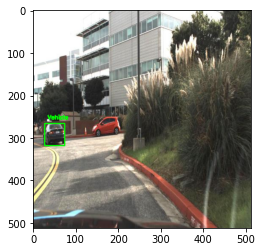

Time :  9  Secs
Predicted : 1
Correct   : 1
Missed    : 1
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


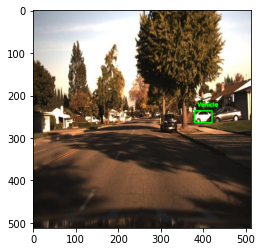

Time :  9  Secs
Predicted : 1
Correct   : 1
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


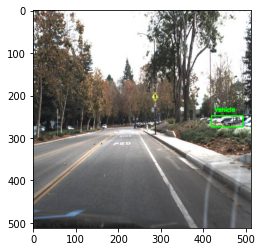

Time :  9  Secs
Predicted : 1
Correct   : 0
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


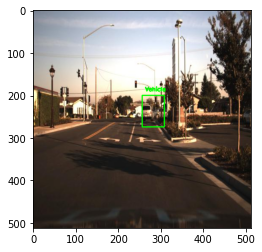

Time :  9  Secs
Predicted : 1
Correct   : 0
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


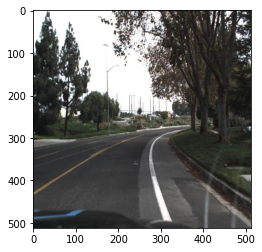

Time :  9  Secs
Predicted : 0
Correct   : 0
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


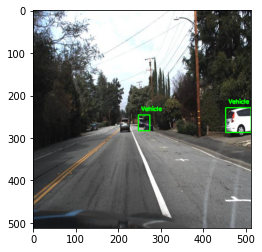

Time :  8  Secs
Predicted : 2
Correct   : 2
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (1605, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


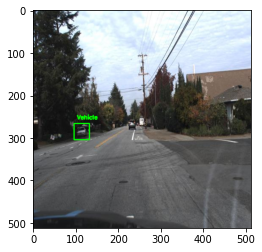

Time :  7  Secs
Predicted : 1
Correct   : 1
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (1488, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


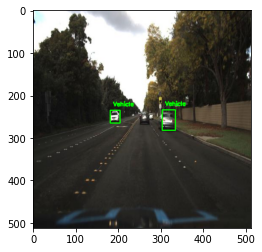

Time :  7  Secs
Predicted : 2
Correct   : 2
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


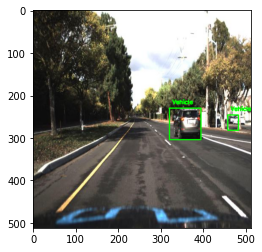

Time :  9  Secs
Predicted : 2
Correct   : 1
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (1937, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


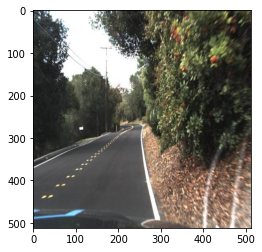

Time :  8  Secs
Predicted : 0
Correct   : 0
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (1890, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


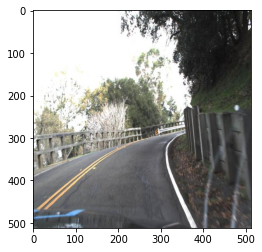

Time :  8  Secs
Predicted : 0
Correct   : 0
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


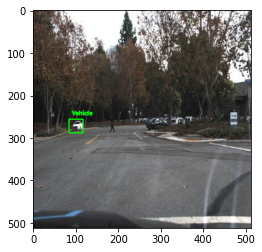

Time :  9  Secs
Predicted : 1
Correct   : 1
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (1857, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


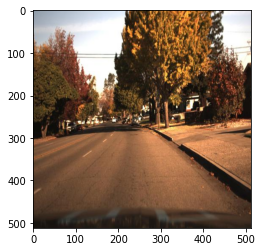

Time :  8  Secs
Predicted : 0
Correct   : 0
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (1776, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


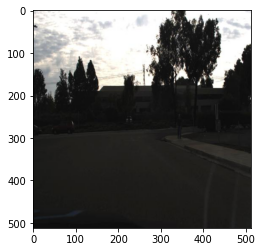

Time :  8  Secs
Predicted : 0
Correct   : 0
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


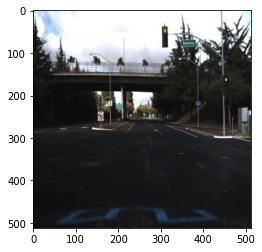

Time :  8  Secs
Predicted : 0
Correct   : 0
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


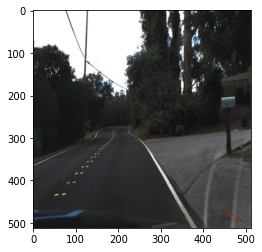

Time :  8  Secs
Predicted : 0
Correct   : 0
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


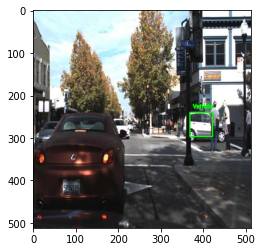

Time :  9  Secs
Predicted : 1
Correct   : 1
Missed    : 2
[INFO] running selective search...
[INFO] proposal shape: (1712, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


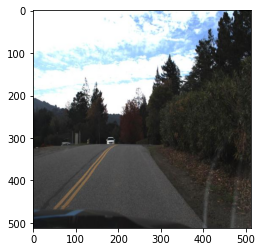

Time :  8  Secs
Predicted : 0
Correct   : 0
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (1961, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


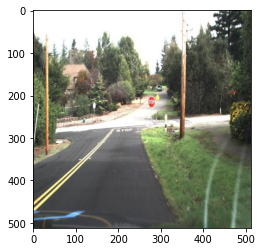

Time :  8  Secs
Predicted : 0
Correct   : 0
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (1816, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


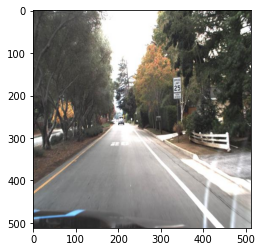

Time :  7  Secs
Predicted : 0
Correct   : 0
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


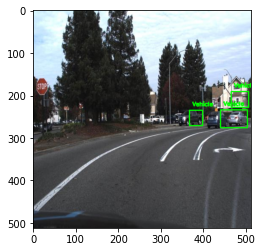

Time :  8  Secs
Predicted : 3
Correct   : 2
Missed    : 1
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


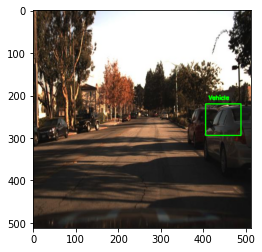

Time :  8  Secs
Predicted : 1
Correct   : 1
Missed    : 4
[INFO] running selective search...
[INFO] proposal shape: (1571, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


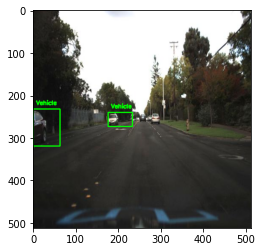

Time :  6  Secs
Predicted : 2
Correct   : 2
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


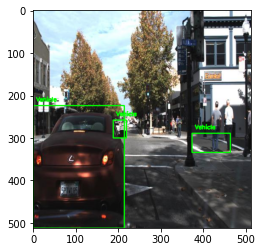

Time :  9  Secs
Predicted : 3
Correct   : 1
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


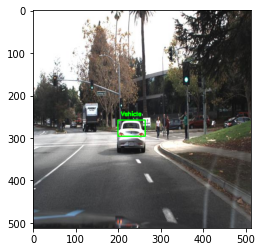

Time :  8  Secs
Predicted : 1
Correct   : 1
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


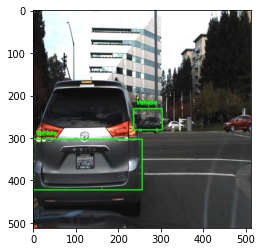

Time :  8  Secs
Predicted : 2
Correct   : 2
Missed    : 1
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


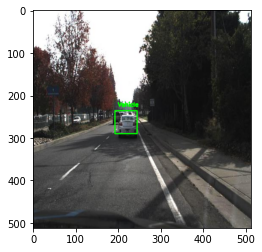

Time :  8  Secs
Predicted : 1
Correct   : 1
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


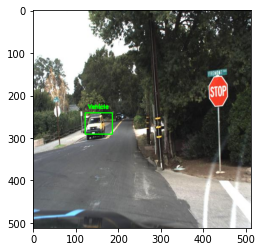

Time :  8  Secs
Predicted : 1
Correct   : 1
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (1584, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


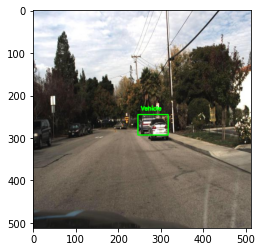

Time :  7  Secs
Predicted : 1
Correct   : 1
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


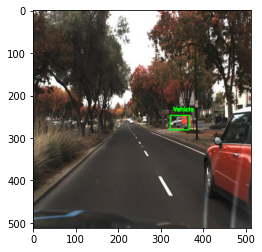

Time :  8  Secs
Predicted : 1
Correct   : 1
Missed    : 1
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


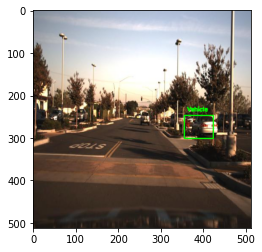

Time :  8  Secs
Predicted : 1
Correct   : 1
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


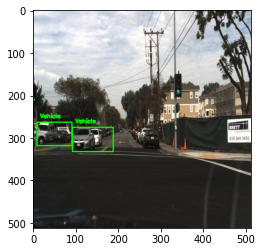

Time :  8  Secs
Predicted : 2
Correct   : 2
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (1575, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


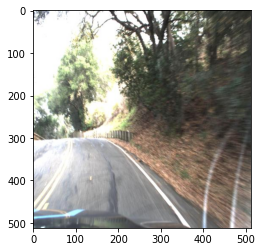

Time :  7  Secs
Predicted : 0
Correct   : 0
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (1603, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


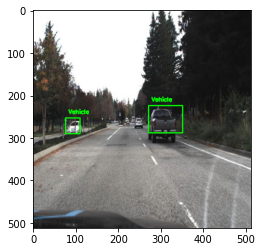

Time :  7  Secs
Predicted : 2
Correct   : 2
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


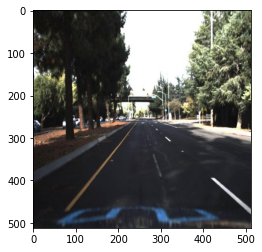

Time :  8  Secs
Predicted : 0
Correct   : 0
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (1294, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


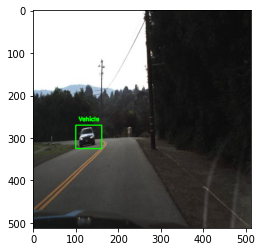

Time :  6  Secs
Predicted : 1
Correct   : 1
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


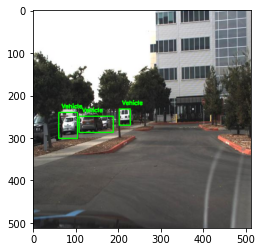

Time :  8  Secs
Predicted : 3
Correct   : 3
Missed    : 1
[INFO] running selective search...
[INFO] proposal shape: (1652, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


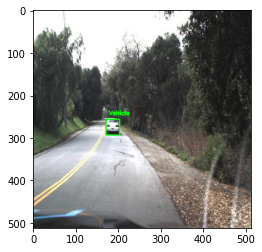

Time :  7  Secs
Predicted : 1
Correct   : 1
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


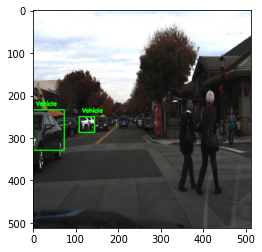

Time :  8  Secs
Predicted : 2
Correct   : 2
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (1867, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


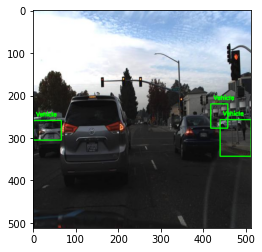

Time :  8  Secs
Predicted : 3
Correct   : 1
Missed    : 2
[INFO] running selective search...
[INFO] proposal shape: (1916, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


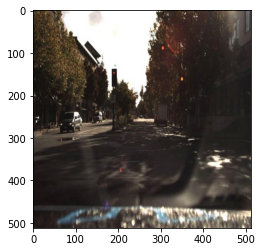

Time :  8  Secs
Predicted : 0
Correct   : 0
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (1938, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


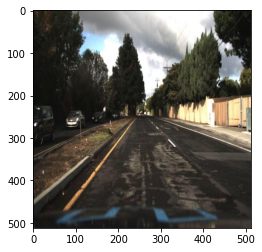

Time :  8  Secs
Predicted : 0
Correct   : 0
Missed    : 2
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


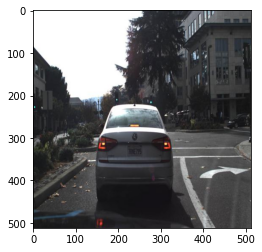

Time :  8  Secs
Predicted : 0
Correct   : 0
Missed    : 1
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


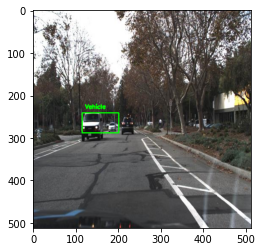

Time :  8  Secs
Predicted : 1
Correct   : 1
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


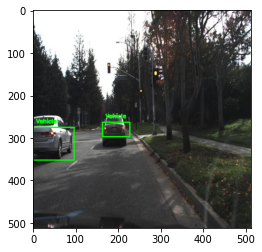

Time :  8  Secs
Predicted : 2
Correct   : 2
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (1158, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


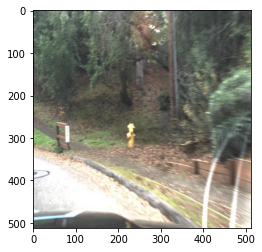

Time :  5  Secs
Predicted : 0
Correct   : 0
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (1680, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


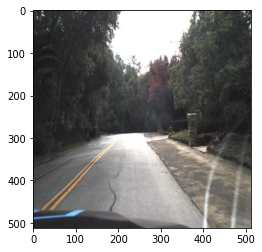

Time :  7  Secs
Predicted : 0
Correct   : 0
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (1821, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


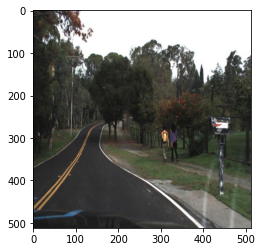

Time :  7  Secs
Predicted : 0
Correct   : 0
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


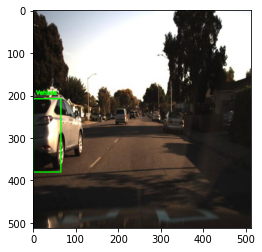

Time :  8  Secs
Predicted : 1
Correct   : 1
Missed    : 1
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


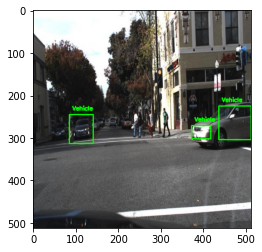

Time :  9  Secs
Predicted : 3
Correct   : 2
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


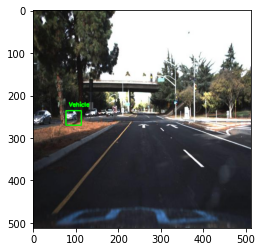

Time :  8  Secs
Predicted : 1
Correct   : 1
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (1683, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


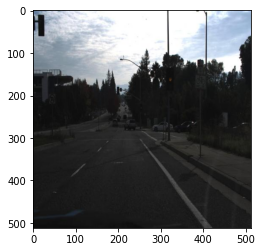

Time :  7  Secs
Predicted : 0
Correct   : 0
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


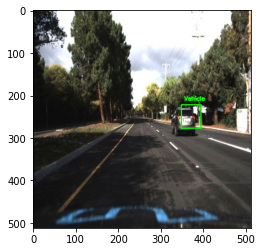

Time :  8  Secs
Predicted : 1
Correct   : 1
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (1441, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


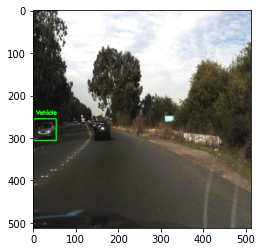

Time :  6  Secs
Predicted : 1
Correct   : 1
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


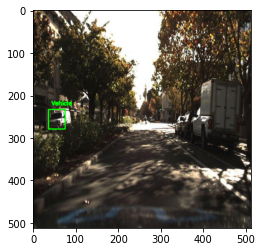

Time :  9  Secs
Predicted : 1
Correct   : 1
Missed    : 2
[INFO] running selective search...
[INFO] proposal shape: (1639, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


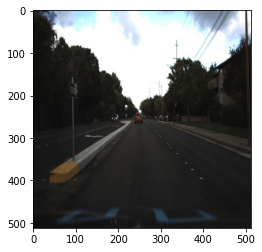

Time :  7  Secs
Predicted : 0
Correct   : 0
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


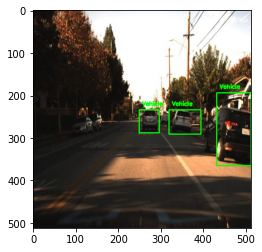

Time :  9  Secs
Predicted : 3
Correct   : 3
Missed    : 1
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


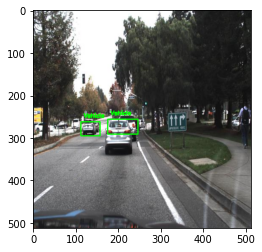

Time :  9  Secs
Predicted : 2
Correct   : 2
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (1636, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


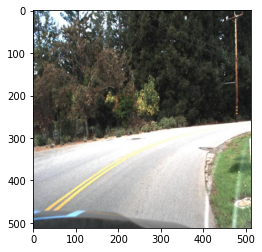

Time :  7  Secs
Predicted : 0
Correct   : 0
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (1928, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


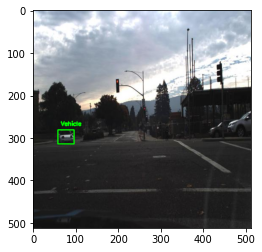

Time :  8  Secs
Predicted : 1
Correct   : 1
Missed    : 1
[INFO] running selective search...
[INFO] proposal shape: (1955, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


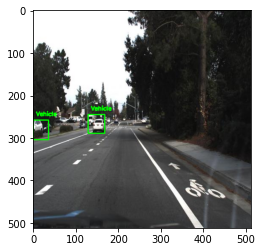

Time :  8  Secs
Predicted : 2
Correct   : 2
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


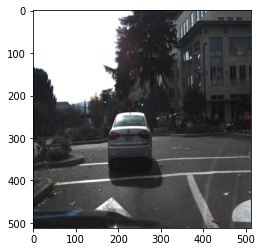

Time :  9  Secs
Predicted : 0
Correct   : 0
Missed    : 1
[INFO] running selective search...
[INFO] proposal shape: (1562, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


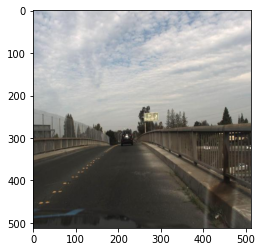

Time :  7  Secs
Predicted : 0
Correct   : 0
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


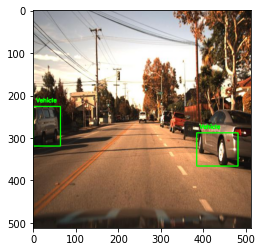

Time :  9  Secs
Predicted : 2
Correct   : 2
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (1901, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


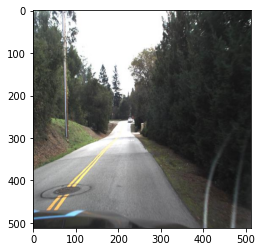

Time :  8  Secs
Predicted : 0
Correct   : 0
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


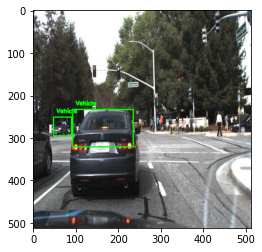

Time :  9  Secs
Predicted : 2
Correct   : 2
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


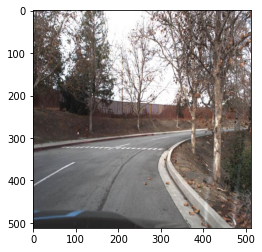

Time :  9  Secs
Predicted : 0
Correct   : 0
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


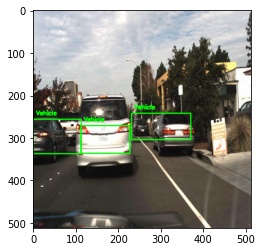

Time :  9  Secs
Predicted : 3
Correct   : 2
Missed    : 2
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


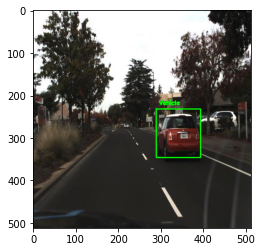

Time :  9  Secs
Predicted : 1
Correct   : 1
Missed    : 1
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


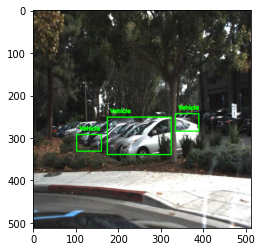

Time :  8  Secs
Predicted : 3
Correct   : 1
Missed    : 4
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


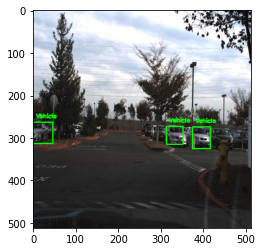

Time :  9  Secs
Predicted : 3
Correct   : 3
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


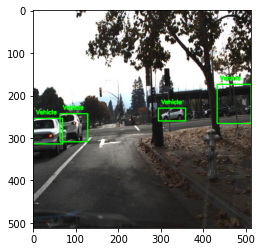

Time :  9  Secs
Predicted : 4
Correct   : 3
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


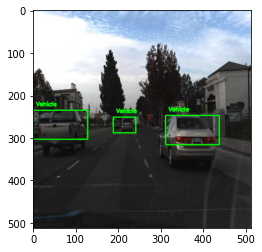

Time :  8  Secs
Predicted : 3
Correct   : 3
Missed    : 0
[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


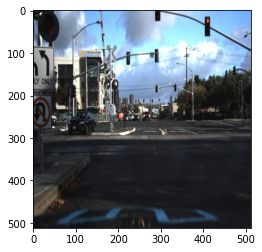

Time :  9  Secs
Predicted : 0
Correct   : 0
Missed    : 2



Total Predicted :  124
Total Correct   :  105
Total Missed    :  41
True Positives  :  85  % 
False Positives :  15  % 
False Negatives  :  35  % 


In [ ]:
#testing the model on test data



# load the our fine-tuned model and label binarizer from disk
print("[INFO] loading model, label binarizer and Annotations")
model = load_model(MODEL_PATH)
lb    = pickle.loads(open(ENCODER_PATH, "rb").read())
annotPath = 'test/test_annotations.csv'
annotsDf  = pd.read_csv(annotPath).values
annots    = defaultdict(list)

for i in range(annotsDf.shape[0]):
    fileName = annotsDf[i][0]
    annots[fileName].append(annotsDf[i][1:])

totalPredicted=0
totalCorrect  =0
totalMissed   =0

for filename in os.listdir('test/test_dataset')[:SAMPLES_TO_TEST]:
    
    image =cv2.imread('test/test_dataset/'+filename)
    
    # run selective search on the image to generate bounding box proposal region
    start=time.time()
    print("[INFO] running selective search...")
    ss    = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
    ss.setBaseImage(image)
    ss.switchToSelectiveSearchFast()
    rects = ss.process()

    # initialize the list of region proposals that we'll be classifying along with their associated bounding boxes
    proposals = []
    boxes     = []

    # loop over the region proposal bounding box coordinates generated by running selective search
    for (x, y, w, h) in rects[:MAX_PROPOSALS]:

        # extract the region from the input image, convert it from BGR to RGB channel ordering, and then resize it to the required input dimensions of our trained CNN
        roi = image[y:y + h, x:x + w]
        roi = cv2.cvtColor(roi, cv2.COLOR_BGR2RGB)
        roi = cv2.resize(roi, INPUT_DIMS,interpolation=cv2.INTER_CUBIC)
        
        # further preprocess the ROI
        roi = img_to_array(roi)
        roi = preprocess_input(roi)
        
        # update our proposals and bounding boxes lists
        proposals.append(roi)
        boxes.append((x, y, x + w, y + h))

    # convert the proposals and bounding boxes into NumPy arrays
    proposals = np.array(proposals, dtype="float32")
    boxes     = np.array(boxes, dtype="int32")
    print("[INFO] proposal shape: {}".format(proposals.shape))

    # classify each of the proposal ROIs using fine-tuned model
    print("[INFO] classifying proposals...")
    proba     = model.predict(proposals)

    # find the index of all predictions that are positive for the "vehicle" class
    print("[INFO] applying NMS...")
    labels    = lb.classes_[np.argmax(proba, axis=1)]
    idxs      = np.where(labels == "vehicle")[0]

    # use the indexes to extract all bounding boxes and associated class label probabilities associated with the "vehicle" class
    boxes = boxes[idxs]
    proba = proba[idxs][:, 1]

    # further filter indexes by enforcing a minimum prediction probability be met
    idxs  = np.where(proba >= MIN_PROBA)
    boxes = boxes[idxs]
    proba = proba[idxs]

    # run non-maxima suppression on the bounding boxes
    boxIdxs = tf.image.non_max_suppression(boxes,proba,COUNT_OF_DETECT,iou_threshold=IOU_THRESHOLD)
    predictedBoxes = []
    for i in boxIdxs:
        predictedBoxes.append(boxes[i])
    
    predicted = 0
    correct   = 0
    
    annotedBoxes=[]
    for box in annots[filename]:
        if (box[2]=='car' or box[2]=='truck')  and (int(box[5])-int(box[3])>MIN_DIM_TO_CONSIDER) and (int(box[6]-int(box[4])>MIN_DIM_TO_CONSIDER)):
            annotedBoxes.append([int(box[3]),int(box[4]),int(box[5]),int(box[6])])
    
    missed    = len(annotedBoxes)
    total     += len(annotedBoxes)

    # loop over the bounding box indexes
    for box in predictedBoxes:
        
        predicted    += 1
        correct      += checkPred(box,annots[filename])
        
        # draw the bounding box, label, and probability on the image
        (startX,startY,endX,endY) = box
        cv2.rectangle(image, (startX, startY), (endX, endY),(0, 255, 0), 2)
        y   = startY - 10 if startY - 10 > 10 else startY + 10
        text= " Vehicle"
        cv2.putText(image, text, (startX, y),cv2.FONT_HERSHEY_SIMPLEX, 0.45, (0, 255, 0), 2)

    for box in annotedBoxes:
        
        missed       -= checkGround(box,predictedBoxes)

    # show the output image *after* running NMS
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.show()
    end=time.time()
    print('Time : ',round(end-start),' Secs')
    print('Predicted :',predicted)
    print('Correct   :',correct)
    print('Missed    :',missed)
    
    totalPredicted+= predicted
    totalCorrect  += correct
    totalMissed   += missed

epsilon=0.000001
print('\n\n')
print('Total Predicted : ',totalPredicted)
print('Total Correct   : ',totalCorrect)
print('Total Missed    : ',totalMissed)
print('True Positives  : ',round(totalCorrect*100/totalPredicted),' % ')
print('False Positives : ',round((totalPredicted-totalCorrect)*100/totalPredicted),' % ')
print('False Negatives  : ',round(totalMissed*100/total),' % ')

[INFO] loading model and label binarizer...
[INFO] running selective search...
[INFO] proposal shape: (1842, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


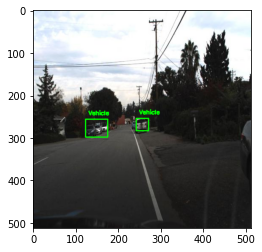

[INFO] running selective search...
[INFO] proposal shape: (1888, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


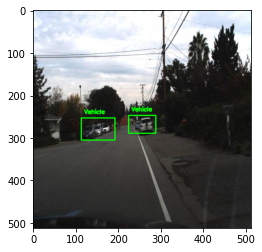

[INFO] running selective search...
[INFO] proposal shape: (1927, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


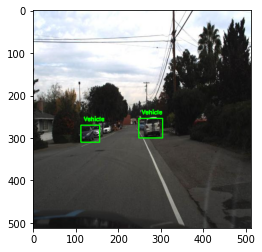

[INFO] running selective search...
[INFO] proposal shape: (1964, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


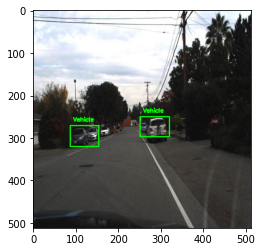

[INFO] running selective search...
[INFO] proposal shape: (1814, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


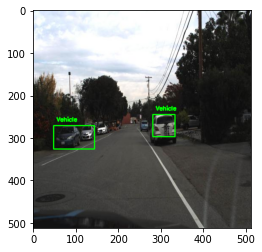

[INFO] running selective search...
[INFO] proposal shape: (1922, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


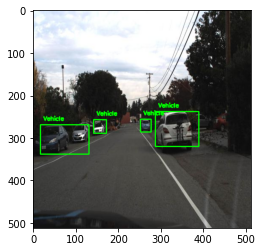

[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


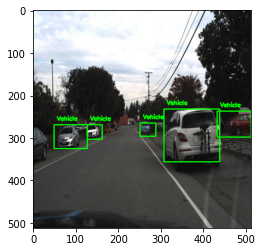

[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


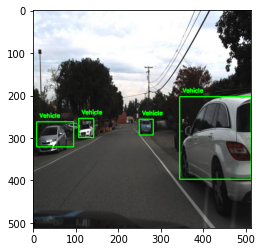

[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


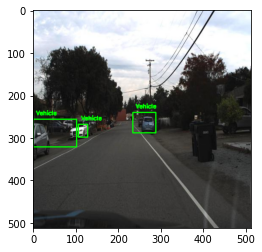

[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


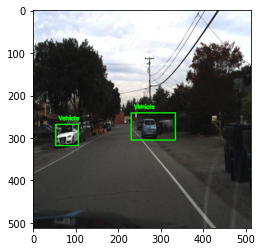

[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


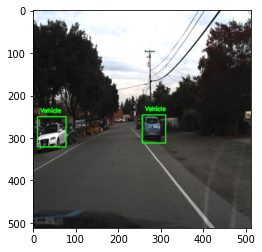

[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


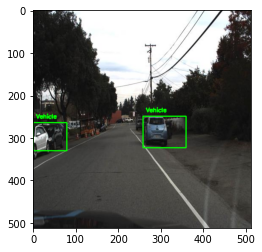

[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


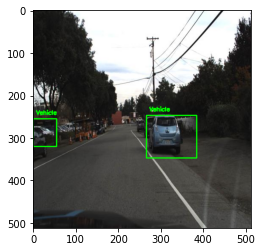

[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


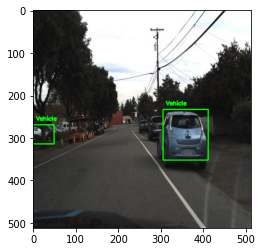

[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


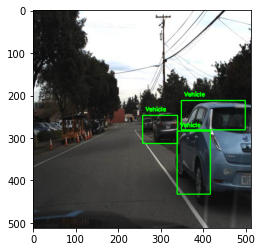

[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


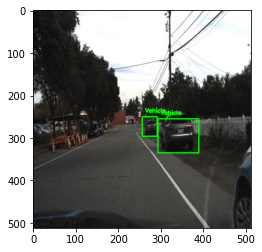

[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


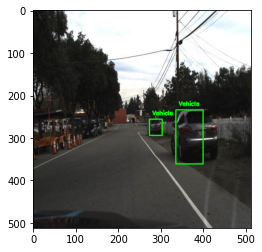

[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


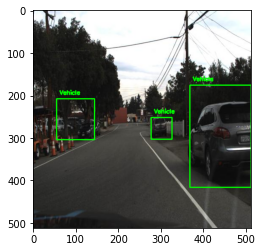

[INFO] running selective search...
[INFO] proposal shape: (1917, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


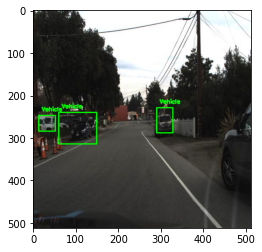

[INFO] running selective search...
[INFO] proposal shape: (1810, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


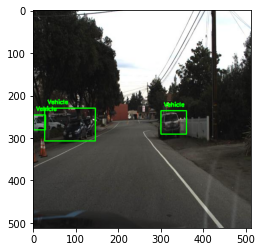

[INFO] running selective search...
[INFO] proposal shape: (1940, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


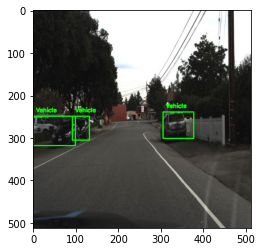

[INFO] running selective search...
[INFO] proposal shape: (1875, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


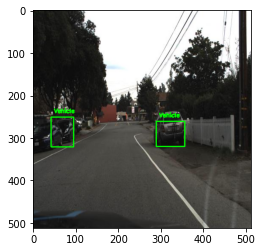

[INFO] running selective search...
[INFO] proposal shape: (2000, 200, 200, 3)
[INFO] classifying proposals...
[INFO] applying NMS...


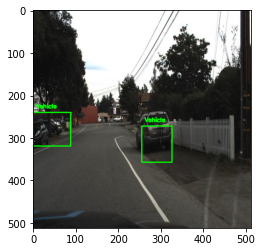

In [ ]:
#predicting on the snapshots from a video


# load the our fine-tuned model and label binarizer from disk
print("[INFO] loading model and label binarizer...")

model = load_model('vehicle_detector.h5')
lb    = pickle.loads(open('label_encoder.pickle', "rb").read())

files=os.listdir('demo_images')
files.sort()
if 'results' not in os.listdir():
  os.mkdir('results')

for filename in files:
  # load the input image from disk
  image = cv2.imread('demo_images/'+filename)

  # run selective search on the image to generate bounding box proposal regions
  print("[INFO] running selective search...")
  ss    = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
  ss.setBaseImage(image)
  ss.switchToSelectiveSearchFast()
  rects = ss.process()

  # initialize the list of region proposals that we'll be classifying along with their associated bounding boxes
  proposals = []
  boxes     = []

  # loop over the region proposal bounding box coordinates generated by running selective search
  for (x, y, w, h) in rects[:2000]:
    
    # extract the region from the input image, convert it from BGR to RGB channel ordering, and then resize it to the required input dimensions of our trained CNN
    roi = image[y:y + h, x:x + w]
    roi = cv2.resize(roi, (200,200),interpolation=cv2.INTER_CUBIC)

    # further preprocess the ROI
    roi = cv2.cvtColor(roi, cv2.COLOR_BGR2RGB)
    roi = img_to_array(roi)
    roi = preprocess_input(roi)

    # update our proposals and bounding boxes lists
    proposals.append(roi)
    boxes.append((x, y, x + w, y + h))

  # convert the proposals and bounding boxes into NumPy arrays
  proposals = np.array(proposals, dtype="float32")
  boxes     = np.array(boxes, dtype="int32")
  print("[INFO] proposal shape: {}".format(proposals.shape))

  # classify each of the proposal ROIs using fine-tuned model
  print("[INFO] classifying proposals...")
  proba     = model.predict(proposals)

  # find the index of all predictions that are positive for the "vehicle" class
  print("[INFO] applying NMS...")
  labels    = lb.classes_[np.argmax(proba, axis=1)]
  idxs      = np.where(labels == "vehicle")[0]

  # use the indexes to extract all bounding boxes and associated class label probabilities associated with the "vehicle" class
  boxes = boxes[idxs]
  proba = proba[idxs][:, 1]

  # further filter indexes by enforcing a minimum prediction probability be met
  idxs  = np.where(proba >= 0.90)
  boxes = boxes[idxs]
  proba = proba[idxs]

  # run non-maxima suppression on the bounding boxes
  boxIdxs = tf.image.non_max_suppression(boxes,proba,10,iou_threshold=0.05)

  # loop over the bounding box indexes
  for i in boxIdxs:
        
    (startX, startY, endX, endY) = boxes[i]
    if (endY-startY)<=(endX-startX)*2:
        # draw the bounding box, label, and probability on the image
        cv2.rectangle(image, (startX, startY), (endX, endY),(0, 255, 0), 2)
        y   = startY - 10 if startY - 10 > 10 else startY + 10
        text= " Vehicle"
        cv2.putText(image, text, (startX, y),cv2.FONT_HERSHEY_SIMPLEX, 0.45, (0, 255, 0), 2)

    # show the output image *after* running NMS
  image=cv2.resize(image,(512,512),interpolation=cv2.INTER_CUBIC)
  cv2.imwrite('results/'+filename,image)
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  plt.imshow(image)
  plt.show()

In [ ]:
#generating video by writing predicted images into the video


# Video Generating function 
def generate_video(): 
    image_folder = 'results' # make sure to use your folder 
    video_name = 'mygeneratedvideo.avi'
      
    images = [img for img in list(paths.list_images(image_folder)) 
              if img.endswith(".jpg") or
                 img.endswith(".jpeg") or
                 img.endswith("png")] 
  
    frame = cv2.imread(os.path.join(images[0])) 
  
    # setting the frame width, height width 
    # the width, height of first image 
    height, width, layers = frame.shape   
  
    video = cv2.VideoWriter(video_name, 0, 1, (width, height))  
  
    # Appending the images to the video one by one 
    for image in images:  
        video.write(cv2.imread(os.path.join(image_folder, image)))  
      
    # Deallocating memories taken for window creation 
    cv2.destroyAllWindows()  
    video.release()  # releasing the video generated 
  
  
# Calling the generate_video function 
generate_video()